In [1]:
!pip install -q 'tensorflow-text==2.15.*'
!pip index versions tensorflow-text

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
s3fs 2024.9.0 requires fsspec==2024.9.0.*, but you have fsspec 2024.6.0 which is incompatible.
tensorflow-decision-forests 1.9.1 requires tensorflow~=2.16.1, but you have tensorflow 2.15.1 which is incompatible.
tensorflow-decision-forests 1.9.1 requires tf-keras~=2.16, but you have tf-keras 2.15.1 which is incompatible.
tensorflow-serving-api 2.16.1 requires tensorflow<3,>=2.16.1, but you have tensorflow 2.15.1 which is incompatible.
tensorflow-text (2.18.0)
Available versions: 2.18.0, 2.17.0, 2.16.1, 2.15.0, 2.14.0, 2.13.0, 2.12.1, 2.12.0, 2.11.0, 2.10.0, 2.9.0, 2.8.2, 2.8.1
  INSTALLED: 2.15.0
  LATEST:    2.18.0


In [2]:
import string
import numpy as np
import pandas as pd
from numpy import array
from pickle import load

from PIL import Image
import pickle
from collections import Counter
import matplotlib.pyplot as plt

import sys, time, os, warnings
warnings.filterwarnings("ignore")
import re

import keras
import tensorflow as tf
from tqdm import tqdm
from nltk.translate.bleu_score import sentence_bleu

from keras.utils import pad_sequences
from keras.utils import load_img
from keras.utils import to_categorical
from keras.utils import plot_model
from keras.models import Model
from keras.layers import Input
from keras.layers import Dense, BatchNormalization
from keras.layers import LSTM
from keras.layers import Embedding
from keras.layers import Dropout
from keras.layers import add
from keras.callbacks import ModelCheckpoint
from keras.utils import img_to_array
#from keras.preprocessing.image import img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.applications.convnext import ConvNeXtTiny, preprocess_input


from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split

2024-12-12 14:10:44.563528: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-12-12 14:10:44.563593: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-12-12 14:10:44.565187: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [3]:
image_path = "/kaggle/input/flickr8k/Images"
data = pd.read_csv("/kaggle/input/flickr8k-nepali-captions-csv/translated_nepali_captions.csv")
jpgs = os.listdir(image_path)
print("Total Images in Dataset = {}".format(len(jpgs)))
print(type(data))
data

Total Images in Dataset = 8091
<class 'pandas.core.frame.DataFrame'>


,caption_id,nepali_caption
0,1000268201_693b08cb0e.jpg#0,गुलाबी लुगा लगाएको बच्चा प्रवेश गर्ने बाटोमा स...
1,1000268201_693b08cb0e.jpg#1,काठको भवनमा जाँदै केटी।
2,1000268201_693b08cb0e.jpg#2,एउटा सानो केटी काठको प्लेहाउसमा चढ्दै।
3,1000268201_693b08cb0e.jpg#3,एउटी सानी केटी आफ्नो खेलघरमा सिँढी चढ्दै।
4,1000268201_693b08cb0e.jpg#4,गुलाबी पोशाक लगाएकी एउटी सानी केटी काठको केबिन...
...,...,...
40450,997722733_0cb5439472.jpg#0,गुलाबी शर्ट लगाएको मान्छे चट्टानको अनुहारमा चढ...
40451,997722733_0cb5439472.jpg#1,एउटा मानिस हावामा उचाइमा चट्टान चढिरहेको छ।
40452,997722733_0cb5439472.jpg#2,रातो शर्ट लगाएको एक व्यक्ति असिस्ट ह्यान्डलले ...
40453,997722733_0cb5439472.jpg#3,रातो शर्ट लगाएको चट्टान आरोही।


In [4]:
data['caption_id'] = data['caption_id'].str.split('#').str[0]
# Or, if you want to keep the rename:
data.rename(columns = {'caption_id':'filename','nepali_caption':'caption'}, inplace = True)
uni_filenames = np.unique(data.filename.values)
data.head()

,filename,caption
0,1000268201_693b08cb0e.jpg,गुलाबी लुगा लगाएको बच्चा प्रवेश गर्ने बाटोमा स...
1,1000268201_693b08cb0e.jpg,काठको भवनमा जाँदै केटी।
2,1000268201_693b08cb0e.jpg,एउटा सानो केटी काठको प्लेहाउसमा चढ्दै।
3,1000268201_693b08cb0e.jpg,एउटी सानी केटी आफ्नो खेलघरमा सिँढी चढ्दै।
4,1000268201_693b08cb0e.jpg,गुलाबी पोशाक लगाएकी एउटी सानी केटी काठको केबिन...


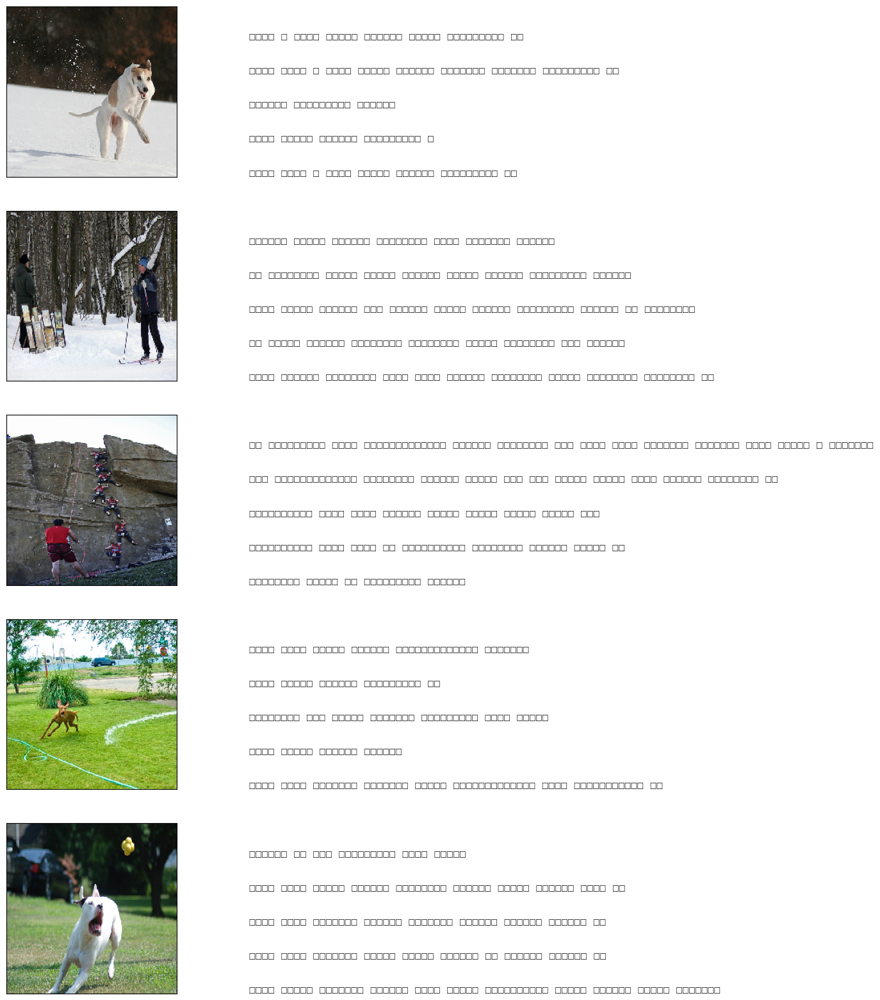

In [5]:
from matplotlib import font_manager
bangla_font_path = "/kaggle/input/nepali-ttf/Nepali.TTF"  # Provide the path to your installed Bangla font
bangla_font_prop = font_manager.FontProperties(fname=bangla_font_path)
npic = 5
npix = 224
target_size = (npix,npix,3)
count = 1

fig = plt.figure(figsize=(10,20))
for jpgfnm in uni_filenames[10:15]:
    filename = image_path + '/' + jpgfnm
    captions = list(data["caption"].loc[data["filename"]==jpgfnm].values)
    image_load = load_img(filename, target_size=target_size)
    ax = fig.add_subplot(npic,2,count,xticks=[],yticks=[])
    ax.imshow(image_load)
    count += 1

    ax = fig.add_subplot(npic,2,count)
    plt.axis('off')
    ax.plot()
    ax.set_xlim(0,1)
    ax.set_ylim(0,len(captions))
    for i, caption in enumerate(captions):
        ax.text(0,i,caption,fontproperties=bangla_font_prop)
    count += 1
plt.show()

In [6]:
uni_filenames = np.unique(data.filename.values)
data.head()

,filename,caption
0,1000268201_693b08cb0e.jpg,गुलाबी लुगा लगाएको बच्चा प्रवेश गर्ने बाटोमा स...
1,1000268201_693b08cb0e.jpg,काठको भवनमा जाँदै केटी।
2,1000268201_693b08cb0e.jpg,एउटा सानो केटी काठको प्लेहाउसमा चढ्दै।
3,1000268201_693b08cb0e.jpg,एउटी सानी केटी आफ्नो खेलघरमा सिँढी चढ्दै।
4,1000268201_693b08cb0e.jpg,गुलाबी पोशाक लगाएकी एउटी सानी केटी काठको केबिन...


In [7]:
vocabulary = []
for txt in data.caption.values:
    vocabulary.extend(txt.split())
print('Vocabulary Size: %d' % len(set(vocabulary)))
print(len(vocabulary))

Vocabulary Size: 15991
334366


In [8]:
for i in vocabulary:
    if len(i)<2:
        vocabulary.remove(i)
vocabulary=set(vocabulary)
print(len(vocabulary))

15963


In [9]:
PATH = "/kaggle/working/images/"
all_captions = []
for caption  in data['caption']:
    caption = '<start> ' + caption+ ' <end>'
    all_captions.append(caption)

all_captions[:10]
if not os.path.exists(PATH):
    os.makedirs(PATH)

In [10]:
import shutil

all_img_name_vector = []
for annot in data["filename"]:
    filename = annot
    source_path = '/kaggle/input/flickr8k/Images/' + filename
    destination_path = '/kaggle/working/images/' + filename
    shutil.copyfile(source_path, destination_path)
    
    full_image_path = PATH + annot
    all_img_name_vector.append(full_image_path)
    
all_img_name_vector[:10]

['/kaggle/working/images/1000268201_693b08cb0e.jpg',
 '/kaggle/working/images/1000268201_693b08cb0e.jpg',
 '/kaggle/working/images/1000268201_693b08cb0e.jpg',
 '/kaggle/working/images/1000268201_693b08cb0e.jpg',
 '/kaggle/working/images/1000268201_693b08cb0e.jpg',
 '/kaggle/working/images/1001773457_577c3a7d70.jpg',
 '/kaggle/working/images/1001773457_577c3a7d70.jpg',
 '/kaggle/working/images/1001773457_577c3a7d70.jpg',
 '/kaggle/working/images/1001773457_577c3a7d70.jpg',
 '/kaggle/working/images/1001773457_577c3a7d70.jpg']

In [11]:
print(f"len(all_img_name_vector) : {len(all_img_name_vector)}")
print(f"len(all_captions) : {len(all_captions)}")

len(all_img_name_vector) : 40455
len(all_captions) : 40455


In [12]:
def data_limiter(num,total_captions,all_img_name_vector):
    train_captions, img_name_vector = shuffle(total_captions,all_img_name_vector,random_state=1)
    train_captions = train_captions[:num]
    img_name_vector = img_name_vector[:num]
    return train_captions,img_name_vector

train_captions,img_name_vector = data_limiter(40000,all_captions,all_img_name_vector)

In [13]:
def load_image(image_path):
    img = tf.io.read_file(image_path)
    img = tf.image.decode_jpeg(img, channels=3)
    img = tf.image.resize(img, (224, 224))  # ConvNeXt typically uses 224x224 input size
    img = preprocess_input(img)  # Use preprocess_input from ConvNeXt
    return img, image_path

# Load the ConvNeXt-Tiny model
image_model = ConvNeXtTiny(include_top=False, weights='imagenet')
new_input = image_model.input
hidden_layer = image_model.layers[-1].output
image_features_extract_model = tf.keras.Model(new_input, hidden_layer)

111650432/111650432 [==============================] - 1s 0us/step


In [14]:
encode_train = sorted(set(img_name_vector))
image_dataset = tf.data.Dataset.from_tensor_slices(encode_train)
image_dataset = image_dataset.map(load_image, num_parallel_calls=tf.data.experimental.AUTOTUNE).batch(64)

In [15]:
%%time
for img, path in tqdm(image_dataset):
    batch_features = image_features_extract_model(img)
    batch_features = tf.reshape(batch_features,
                             (batch_features.shape[0], -1, batch_features.shape[3]))

    for bf, p in zip(batch_features, path):
        path_of_feature = p.numpy().decode("utf-8")
        np.save(path_of_feature, bf.numpy())

  0%|          | 0/127 [00:00<?, ?it/s]WARNING: All log messages before absl::InitializeLog() is called are written to STDERR
I0000 00:00:1734012754.598201      22 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
100%|██████████| 127/127 [00:42<00:00,  3.02it/s]

CPU times: user 1min 7s, sys: 2.88 s, total: 1min 10s
Wall time: 42.1 s


In [16]:
top_k = 12000
tokenizer = tf.keras.preprocessing.text.Tokenizer(num_words=top_k,
                                                 oov_token="<unk>",
                                                 filters='!"#$%&()*+.,-/:;=?@[\\]^_`{|}~\t\n')
tokenizer.fit_on_texts(train_captions)
train_seqs = tokenizer.texts_to_sequences(train_captions)
tokenizer.word_index['<pad>'] = 0
tokenizer.index_word[0] = '<pad>'
max_length=25
train_seqs = tokenizer.texts_to_sequences(train_captions)
cap_vector = tf.keras.preprocessing.sequence.pad_sequences(train_seqs, padding='post',maxlen=max_length)
#Let’s visualize the padded training and captions and the tokenized vectors:

train_captions[:3]
print(cap_vector[0])
print(len(cap_vector[0]))

[   2   77   92  336 1321  758 1086    3    0    0    0    0    0    0
    0    0    0    0    0    0    0    0    0    0    0]
25


In [17]:
train_seqs[:3]

[[2, 77, 92, 336, 1321, 758, 1086, 3],
 [2, 1406, 1718, 793, 508, 4880, 462, 429, 50, 191, 123, 3],
 [2, 4, 13, 8, 121, 452, 146, 30, 5, 3]]

In [18]:
def calc_max_length(tensor):
    return max(len(t) for t in tensor)
max_length = calc_max_length(train_seqs)
max_length=25
def calc_min_length(tensor):
    return min(len(t) for t in tensor)
min_length = calc_min_length(train_seqs)

print('Max Length of any caption : Min Length of any caption = '+ str(max_length) +" : "+str(min_length))

Max Length of any caption : Min Length of any caption = 25 : 3


In [19]:
img_name_train, img_name_val, cap_train, cap_val = train_test_split(img_name_vector,cap_vector, test_size=0.02, random_state=0)

In [20]:
BATCH_SIZE = 64
BUFFER_SIZE = 1000
num_steps = len(img_name_train) // BATCH_SIZE

def map_func(img_name, cap):
    img_tensor = np.load(img_name.decode('utf-8')+'.npy')
    return img_tensor, cap

dataset = tf.data.Dataset.from_tensor_slices((img_name_train, cap_train))
dataset = dataset.map(lambda item1, item2: tf.numpy_function(map_func, [item1, item2], [tf.float32, tf.int32]),num_parallel_calls=tf.data.experimental.AUTOTUNE)
dataset = dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
dataset = dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [21]:
#num_steps = len(img_name_val) // BATCH_SIZE
val_dataset = tf.data.Dataset.from_tensor_slices((img_name_val, cap_val))
val_dataset = val_dataset.map(lambda item1, item2: tf.numpy_function(map_func, [item1, item2], [tf.float32, tf.int32]), num_parallel_calls=tf.data.experimental.AUTOTUNE)
val_dataset = val_dataset.shuffle(BUFFER_SIZE).batch(BATCH_SIZE)
val_dataset = val_dataset.prefetch(buffer_size=tf.data.experimental.AUTOTUNE)

In [22]:
def get_angles(pos, i, d_model):
    angle_rates = 1 / np.power(10000, (2 * (i//2)) / np.float32(d_model))
    return pos * angle_rates

def positional_encoding_1d(position, d_model):
    angle_rads = get_angles(np.arange(position)[:, np.newaxis],
                           np.arange(d_model)[np.newaxis, :],
                           d_model)

    angle_rads[:, 0::2] = np.sin(angle_rads[:, 0::2])
    angle_rads[:, 1::2] = np.cos(angle_rads[:, 1::2])
    pos_encoding = angle_rads[np.newaxis, ...]
    return tf.cast(pos_encoding, dtype=tf.float32)

def positional_encoding_2d(row,col,d_model):
    assert d_model % 2 == 0
    row_pos = np.repeat(np.arange(row),col)[:,np.newaxis]
    col_pos = np.repeat(np.expand_dims(np.arange(col),0),row,axis=0).reshape(-1,1)

    angle_rads_row = get_angles(row_pos,np.arange(d_model//2)[np.newaxis,:],d_model//2)
    angle_rads_col = get_angles(col_pos,np.arange(d_model//2)[np.newaxis,:],d_model//2)

    angle_rads_row[:, 0::2] = np.sin(angle_rads_row[:, 0::2])
    angle_rads_row[:, 1::2] = np.cos(angle_rads_row[:, 1::2])
    angle_rads_col[:, 0::2] = np.sin(angle_rads_col[:, 0::2])
    angle_rads_col[:, 1::2] = np.cos(angle_rads_col[:, 1::2])
    pos_encoding = np.concatenate([angle_rads_row,angle_rads_col],axis=1)[np.newaxis, ...]
    return tf.cast(pos_encoding, dtype=tf.float32)

In [23]:
def create_padding_mask(seq):
    seq = tf.cast(tf.math.equal(seq, 0), tf.float32)
    return seq[:, tf.newaxis, tf.newaxis, :]  # (batch_size, 1, 1, seq_len)

def create_look_ahead_mask(size):
    mask = 1 - tf.linalg.band_part(tf.ones((size, size)), -1, 0)
    return mask  # (seq_len, seq_len)

def scaled_dot_product_attention(q, k, v, mask):
    matmul_qk = tf.matmul(q, k, transpose_b=True)  # (..., seq_len_q, seq_len_k)
    dk = tf.cast(tf.shape(k)[-1], tf.float32)
    scaled_attention_logits = matmul_qk / tf.math.sqrt(dk)
    if mask is not None:
        scaled_attention_logits += (mask * -1e9) 
    attention_weights = tf.nn.softmax(scaled_attention_logits, axis=-1) 
    output = tf.matmul(attention_weights, v)  # (..., seq_len_q, depth_v)
#     print(output.shape)
#     image =array_to_img(output)
#     image.show()
    return output, attention_weights

class MultiHeadAttention(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads):
        super(MultiHeadAttention, self).__init__()
        self.num_heads = num_heads
        self.d_model = d_model
        assert d_model % self.num_heads == 0
        self.depth = d_model // self.num_heads
        self.wq = tf.keras.layers.Dense(d_model)
        self.wk = tf.keras.layers.Dense(d_model)
        self.wv = tf.keras.layers.Dense(d_model)
        self.dense = tf.keras.layers.Dense(d_model)

    def split_heads(self, x, batch_size):
        x = tf.reshape(x, (batch_size, -1, self.num_heads, self.depth))
        return tf.transpose(x, perm=[0, 2, 1, 3])

    def call(self, v, k, q, mask=None):
        batch_size = tf.shape(q)[0]
        q = self.wq(q)  # (batch_size, seq_len, d_model)
        k = self.wk(k)  # (batch_size, seq_len, d_model)
        v = self.wv(v)  # (batch_size, seq_len, d_model)

        q = self.split_heads(q, batch_size)  # (batch_size, num_heads, seq_len_q, depth)
        k = self.split_heads(k, batch_size)  # (batch_size, num_heads, seq_len_k, depth)
        v = self.split_heads(v, batch_size)  # (batch_size, num_heads, seq_len_v, depth)

        scaled_attention, attention_weights = scaled_dot_product_attention(q, k, v, mask)
        scaled_attention = tf.transpose(scaled_attention, perm=[0, 2, 1, 3])  # (batch_size, seq_len_q,      num_heads, depth)

        concat_attention = tf.reshape(scaled_attention,(batch_size, -1, self.d_model))  # (batch_size, seq_len_q, d_model)

        output = self.dense(concat_attention)  # (batch_size, seq_len_q, d_model)
        return output, attention_weights

def point_wise_feed_forward_network(d_model, dff):
    return tf.keras.Sequential([
                tf.keras.layers.Dense(dff, activation='relu'),tf.keras.layers.Dense(d_model)])# (batch_size, seq_len, d_model)])

In [24]:
class EncoderLayer(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads, dff, rate=0.001):
        super(EncoderLayer, self).__init__()
        self.mha = MultiHeadAttention(d_model, num_heads)
        self.ffn = point_wise_feed_forward_network(d_model, dff)

        self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)

        self.dropout1 = tf.keras.layers.Dropout(rate)
        self.dropout2 = tf.keras.layers.Dropout(rate)


    def call(self, x, training, mask=None):
        attn_output, _ = self.mha(x, x, x, mask)  # (batch_size, input_seq_len, d_model)
        attn_output = self.dropout1(attn_output, training=training)
        out1 = self.layernorm1(x + attn_output)  # (batch_size, input_seq_len, d_model)

        ffn_output = self.ffn(out1)  # (batch_size, input_seq_len, d_model)
        ffn_output = self.dropout2(ffn_output, training=training)
        out2 = self.layernorm2(out1 + ffn_output)  # (batch_size, input_seq_len, d_model)
        return out2
class DecoderLayer(tf.keras.layers.Layer):
    def __init__(self, d_model, num_heads, dff, rate=0.001):
        super(DecoderLayer, self).__init__()
        self.mha1 = MultiHeadAttention(d_model, num_heads)
        self.mha2 = MultiHeadAttention(d_model, num_heads)

        self.ffn = point_wise_feed_forward_network(d_model, dff)

        self.layernorm1 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.layernorm2 = tf.keras.layers.LayerNormalization(epsilon=1e-6)
        self.layernorm3 = tf.keras.layers.LayerNormalization(epsilon=1e-6)

        self.dropout1 = tf.keras.layers.Dropout(rate)
        self.dropout2 = tf.keras.layers.Dropout(rate)
        self.dropout3 = tf.keras.layers.Dropout(rate)

    def call(self, x, enc_output, training,look_ahead_mask=None, padding_mask=None):
        attn1, attn_weights_block1 = self.mha1(x, x, x, look_ahead_mask)  # (batch_size, target_seq_len, d_model)
        attn1 = self.dropout1(attn1, training=training)
        out1 = self.layernorm1(attn1 + x)

        attn2, attn_weights_block2 = self.mha2(enc_output, enc_output, out1, padding_mask) 
        attn2 = self.dropout2(attn2, training=training)
        out2 = self.layernorm2(attn2 + out1)  # (batch_size, target_seq_len, d_model)

        ffn_output = self.ffn(out2)  # (batch_size, target_seq_len, d_model)
        ffn_output = self.dropout3(ffn_output, training=training)
        out3 = self.layernorm3(ffn_output + out2)  # (batch_size, target_seq_len, d_model)
        return out3, attn_weights_block1, attn_weights_block2

In [25]:
class Encoder(tf.keras.layers.Layer):
    def __init__(self, num_layers, d_model, num_heads, dff, row_size,col_size,rate=0.001):
        super(Encoder, self).__init__()
        self.d_model = d_model
        self.num_layers = num_layers

        self.embedding = tf.keras.layers.Dense(self.d_model,activation='relu')
        self.pos_encoding = positional_encoding_2d(row_size,col_size,self.d_model)

        self.enc_layers = [EncoderLayer(d_model, num_heads, dff, rate) for _ in range(num_layers)]
        self.dropout = tf.keras.layers.Dropout(rate)

    def call(self, x, training, mask=None):
        seq_len = tf.shape(x)[1]
        x = self.embedding(x)  # (batch_size, input_seq_len(H*W), d_model)
        x += self.pos_encoding[:, :seq_len, :]
        x = self.dropout(x, training=training)

        for i in range(self.num_layers):
            x = self.enc_layers[i](x, training, mask)

        return x  # (batch_size, input_seq_len, d_model)
class Decoder(tf.keras.layers.Layer):
    def __init__(self, num_layers,d_model,num_heads,dff, target_vocab_size, maximum_position_encoding,   rate=0.001):
        super(Decoder, self).__init__()
        self.d_model = d_model
        self.num_layers = num_layers

        self.embedding = tf.keras.layers.Embedding(target_vocab_size, d_model)
        self.pos_encoding = positional_encoding_1d(maximum_position_encoding, d_model)

        self.dec_layers = [DecoderLayer(d_model, num_heads, dff, rate)
                         for _ in range(num_layers)]
        self.dropout = tf.keras.layers.Dropout(rate)

    def call(self, x, enc_output, training,look_ahead_mask=None, padding_mask=None):
        seq_len = tf.shape(x)[1]
        attention_weights = {}

        x = self.embedding(x)  # (batch_size, target_seq_len, d_model)
        x *= tf.math.sqrt(tf.cast(self.d_model, tf.float32))
        x += self.pos_encoding[:, :seq_len, :]
        x = self.dropout(x, training=training)

        for i in range(self.num_layers):
            x, block1, block2 = self.dec_layers[i](x, enc_output, training,
                                            look_ahead_mask, padding_mask)
         
            attention_weights['decoder_layer{}_block1'.format(i+1)] = block1
            attention_weights['decoder_layer{}_block2'.format(i+1)] = block2
        return x, attention_weights

In [26]:
import time

In [27]:
class Transformer(tf.keras.Model):
    def __init__(self, num_layers, d_model, num_heads, dff,row_size,col_size,
              target_vocab_size,max_pos_encoding, rate=0.001):
        super(Transformer, self).__init__()
        self.encoder = Encoder(num_layers, d_model, num_heads, dff,row_size,col_size, rate)
        self.decoder = Decoder(num_layers, d_model, num_heads, dff,target_vocab_size,max_pos_encoding, rate)
        self.final_layer = tf.keras.layers.Dense(target_vocab_size)

    def call(self, inp, tar, training,look_ahead_mask=None,dec_padding_mask=None,enc_padding_mask=None   ):
        enc_output = self.encoder(inp, training, enc_padding_mask)  # (batch_size, inp_seq_len, d_model      )
        dec_output, attention_weights = self.decoder(tar, enc_output, training, look_ahead_mask, dec_padding_mask)
        final_output = self.final_layer(dec_output)  # (batch_size, tar_seq_len, target_vocab_size)
        return final_output, attention_weights

In [28]:
num_layer = 8
d_model = 512
dff = 2048
num_heads = 8
row_size = 8
col_size = 8
target_vocab_size = top_k + 1
dropout_rate = 0.001
class CustomSchedule(tf.keras.optimizers.schedules.LearningRateSchedule):
    def __init__(self, d_model, warmup_steps=4000):
        super(CustomSchedule, self).__init__()
        self.d_model = d_model
        self.d_model = tf.cast(self.d_model, tf.float32)
        self.warmup_steps = warmup_steps
    def __call__(self, step):
        step = tf.cast(step, tf.float32)  
        arg1 = tf.math.rsqrt(step)
        arg2 = step * (self.warmup_steps ** -1.5)
        #print(tf.math.rsqrt(self.d_model) * tf.math.minimum(arg1, arg2))
        return tf.math.rsqrt(self.d_model) * tf.math.minimum(arg1, arg2)
learning_rate = CustomSchedule(d_model)
optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.9, beta_2=0.98,
                                    epsilon=1e-9)
loss_object = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True, reduction='none')

def loss_function(real, pred):
    mask = tf.math.logical_not(tf.math.equal(real, 0))
    loss_ = loss_object(real, pred)
    mask = tf.cast(mask, dtype=loss_.dtype)
    loss_ *= mask
    return tf.reduce_sum(loss_)/tf.reduce_sum(mask)
train_loss = tf.keras.metrics.Mean(name='train_loss')
train_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='train_accuracy')

val_loss = tf.keras.metrics.Mean(name='val_loss')
val_accuracy = tf.keras.metrics.SparseCategoricalAccuracy(name='val_accuracy')

transformer = Transformer(num_layer,d_model,num_heads,dff,row_size,col_size,target_vocab_size,max_pos_encoding=target_vocab_size,rate=dropout_rate)

In [29]:
def create_masks_decoder(tar):
    look_ahead_mask = create_look_ahead_mask(tf.shape(tar)[1])
    dec_target_padding_mask = create_padding_mask(tar)
    combined_mask = tf.maximum(dec_target_padding_mask, look_ahead_mask)
    return combined_mask
@tf.function
def train_step(img_tensor, tar):
    tar_inp = tar[:, :-1]
    tar_real = tar[:, 1:]
    dec_mask = create_masks_decoder(tar_inp)
    with tf.GradientTape() as tape:
        predictions, _ = transformer(img_tensor, tar_inp,True, dec_mask)
        loss = loss_function(tar_real, predictions)

    gradients = tape.gradient(loss, transformer.trainable_variables)   
    optimizer.apply_gradients(zip(gradients, transformer.trainable_variables))
    train_loss(loss)
    train_accuracy(tar_real, predictions)
    
def valid_step(img_tensor, tar):
    tar_inp = tar[:, :-1]
    tar_real = tar[:, 1:]
    dec_mask = create_masks_decoder(tar_inp)
    with tf.GradientTape() as tape:
        val_predictions, _ = transformer(img_tensor, tar_inp,True, dec_mask)
        val_loss_value = loss_function(tar_real, val_predictions)
    val_loss(val_loss_value)
    val_accuracy(tar_real, val_predictions)

train_accuracy_values = []
train_loss_values=[]
val_accuracy_values = []
val_loss_values=[]
for epoch in range(100):
    start = time.time()
    train_loss.reset_states()
    train_accuracy.reset_states()
    val_loss.reset_states()
    val_accuracy.reset_states()
    for (batch, (img_tensor, tar)) in enumerate(dataset):
        train_step(img_tensor, tar)
        if batch % 50 == 0:
            print ('Epoch {} Batch {} Loss {:.4f} Accuracy {:.4f}'.format(
         epoch + 1, batch, train_loss.result(), train_accuracy.result()))
    # Validation loop
    for (batch, (val_img_tensor, val_tar)) in enumerate(val_dataset):
        valid_step(img_tensor, tar)

    
    train_accuracy_values.append(train_accuracy.result())
    train_loss_values.append(train_loss.result())
    val_accuracy_values.append(val_accuracy.result())
    val_loss_values.append(val_loss.result())
    
    print('Epoch {} Loss {:.4f} Accuracy {:.4f} Val Loss {:.4f} Val Accuracy {:.4f}'.format(
        epoch + 1, train_loss.result(), train_accuracy.result(), val_loss.result(), val_accuracy.result()))
    print ('Time taken for 1 epoch: {} secs\n'.format(time.time() - start))

Epoch 1 Batch 0 Loss 9.3798 Accuracy 0.0000
Epoch 1 Batch 50 Loss 8.9908 Accuracy 0.0324
Epoch 1 Batch 100 Loss 8.6966 Accuracy 0.0370
Epoch 1 Batch 150 Loss 8.4425 Accuracy 0.0385
Epoch 1 Batch 200 Loss 8.1673 Accuracy 0.0394
Epoch 1 Batch 250 Loss 7.8851 Accuracy 0.0410
Epoch 1 Batch 300 Loss 7.6133 Accuracy 0.0431
Epoch 1 Batch 350 Loss 7.3834 Accuracy 0.0455
Epoch 1 Batch 400 Loss 7.1932 Accuracy 0.0479
Epoch 1 Batch 450 Loss 7.0251 Accuracy 0.0506
Epoch 1 Batch 500 Loss 6.8735 Accuracy 0.0533
Epoch 1 Batch 550 Loss 6.7357 Accuracy 0.0560
Epoch 1 Batch 600 Loss 6.6081 Accuracy 0.0586
Epoch 1 Loss 6.5783 Accuracy 0.0593 Val Loss 5.0069 Val Accuracy 0.0853
Time taken for 1 epoch: 217.01926732063293 secs

Epoch 2 Batch 0 Loss 5.0324 Accuracy 0.1035
Epoch 2 Batch 50 Loss 5.0670 Accuracy 0.0926
Epoch 2 Batch 100 Loss 4.9895 Accuracy 0.0933
Epoch 2 Batch 150 Loss 4.9419 Accuracy 0.0946
Epoch 2 Batch 200 Loss 4.8958 Accuracy 0.0963
Epoch 2 Batch 250 Loss 4.8546 Accuracy 0.0975
Epoch 2 Bat

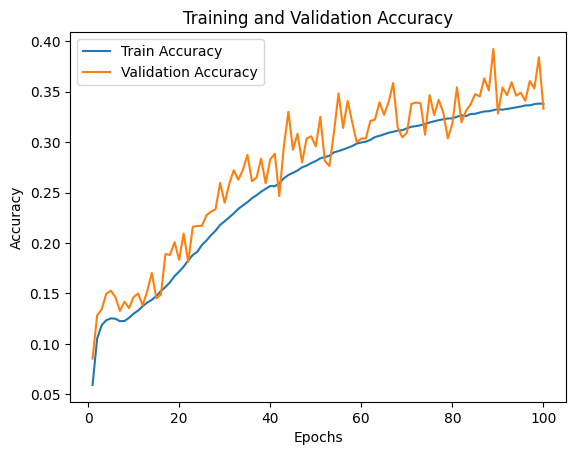

In [30]:
# Plotting the accuracy values
num_epochs=100
epochs = range(1, num_epochs + 1)
plt.plot(epochs, train_accuracy_values, label='Train Accuracy')
plt.plot(epochs, val_accuracy_values, label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.show()

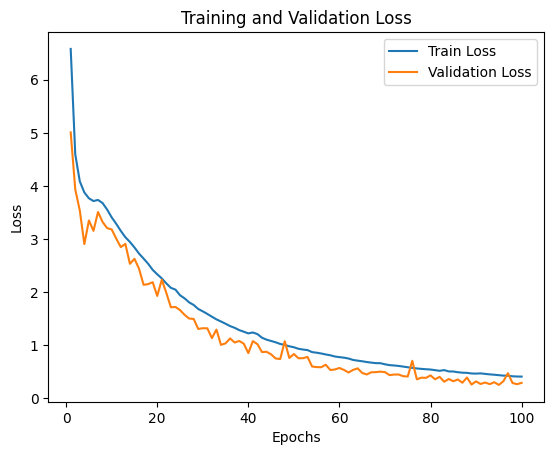

In [31]:
# Plotting the accuracy values
num_epochs=100
epochs = range(1, num_epochs + 1)
plt.plot(epochs, train_loss_values, label='Train Loss')
plt.plot(epochs, val_loss_values, label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()

In [32]:
def evaluate(image):
    temp_input = tf.expand_dims(load_image(image)[0], 0)
    img_tensor_val = image_features_extract_model(temp_input)
    img_tensor_val = tf.reshape(img_tensor_val, (img_tensor_val.shape[0], -1, img_tensor_val.shape[3]))
    start_token = tokenizer.word_index['<start>']
    end_token = tokenizer.word_index['<end>']
    decoder_input = [start_token]
    output = tf.expand_dims(decoder_input, 0) #tokens
    result = [] #word list
    attention_weights_list = []  # List to store attention weights
    for i in range(100):
        dec_mask = create_masks_decoder(output)
        predictions, attention_weights = transformer(img_tensor_val,output,False,dec_mask)
        predictions = predictions[: ,-1:, :]  # (batch_size, 1, vocab_size)
        predicted_id = tf.cast(tf.argmax(predictions, axis=-1), tf.int32)
        if predicted_id == end_token:
            return result,tf.squeeze(output, axis=0), attention_weights_list
        result.append(tokenizer.index_word[int(predicted_id)])
        output = tf.concat([output, predicted_id], axis=-1)
        # Store the attention weights for this step
        attention_weights_list.append(attention_weights)
    return result,tf.squeeze(output, axis=0), attention_weights_list

In [33]:
import matplotlib.colors as mcolors
def plot_attention(image, result, attention_plot):
    len_result = len(result)
    fig = plt.figure(figsize=(10, 10))

    for l in range(len_result):
        if l >= len(attention_plot):
            break
        
        temp_image = np.array(Image.open(image))
        temp_att = np.resize(attention_plot[l]['decoder_layer1_block1'], (8, 8))
        
        # Convert attention map to uint8 data type and apply colormap
        temp_att = (temp_att * 255).astype(np.uint8)
        temp_att = plt.get_cmap('viridis')(temp_att)[:, :, :3]  # Apply colormap (remove alpha channel)
        
        ax = fig.add_subplot(len_result//2, len_result//2, l+1)
        
        if result[l]:
            ax.set_title(str(result[l]), fontproperties=bangla_font_prop)
        else:
            ax.set_title("No Caption", fontproperties=bangla_font_prop)

        img = ax.imshow(temp_image)
        ax.imshow(temp_att, alpha=0.6, extent=img.get_extent())

    plt.tight_layout()

/kaggle/working/images/842960985_91daf0d6ec.jpg
BLEU-4 score: 12.124938447912854
BLEU-3 score: 9.260574705706839
BLEU-2 score: 17.02479136829039
BLEU-1 score: 19.824067293229195
Real Caption: सेतो कपाल लामो ट्रेन्च कोट र छाता भएको मानिस पार्किङ मिटरबाट अघि बढ्दैछ।
Predicted Caption: डकमा बच्चा समात्दै र छाता बोकेको मान्छे।


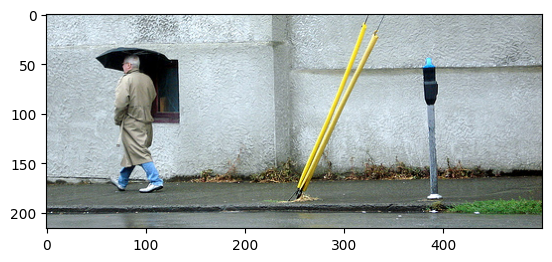

In [34]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3301744710_b51280eb56.jpg
BLEU-4 score: 50.0
BLEU-3 score: 37.79644730092272
BLEU-2 score: 32.585561793662905
BLEU-1 score: 39.2814650900513
Real Caption: नीलो शर्ट लगाएको मानिसले कलाको टुक्रा समातेको छ।
Predicted Caption: नीलो शर्ट लगाएको मान्छेले तस्विर हेरेर मुस्कुराउँदै छ।


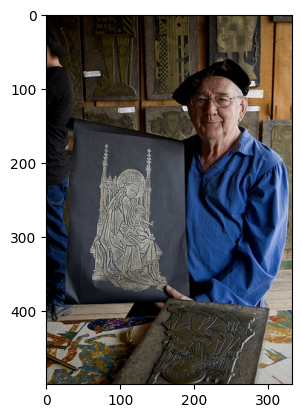

In [35]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/578274277_652cae32ba.jpg
BLEU-4 score: 30.0
BLEU-3 score: 54.77225575051661
BLEU-2 score: 69.6845301935949
BLEU-1 score: 74.00828044922852
Real Caption: सानो केटा रातो हातमा तैरिरहेको पोखरीमा घुमिरहेको छ।
Predicted Caption: रातो फ्लोटिज लगाएको एउटा जवान केटा पोखरीमा हाम फाल्न लागेको


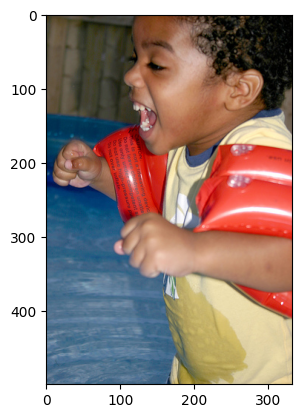

In [36]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/475778645_65b7343c47.jpg
BLEU-4 score: 10.000000000000002
BLEU-3 score: 31.6227766016838
BLEU-2 score: 50.11872336272724
BLEU-1 score: 56.23413251903491
Real Caption: केटा सेतो चट्टानको पर्खाल चढ्दै छ।
Predicted Caption: रातो शर्ट लगाएको एउटा सानो बच्चा रूखको टुक्रामा उभिएको छ।


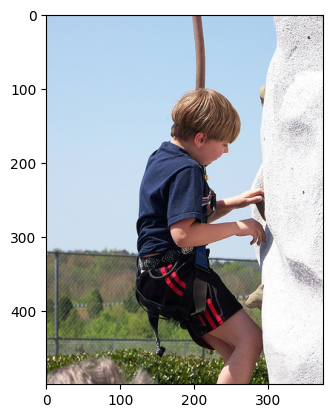

In [37]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3120953244_b00b152246.jpg
BLEU-4 score: 14.715177646857693
BLEU-3 score: 23.266738769033594
BLEU-2 score: 27.946248434549297
BLEU-1 score: 29.256375127882826
Real Caption: एउटा सानो केटा र एउटी केटी बाहिर बुलबुले खेल्दै छन्।
Predicted Caption: एक केटा क्यामेरामा बुलबुले उडाउँदै।


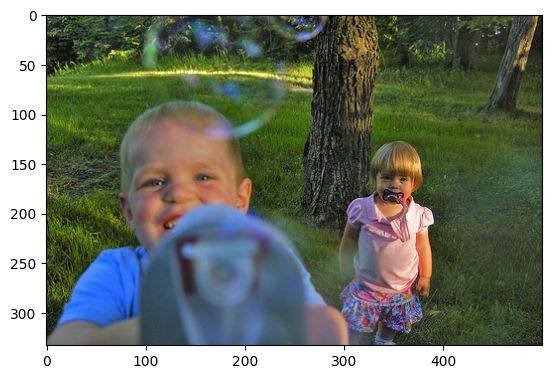

In [38]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3537520829_aab733e16c.jpg
BLEU-4 score: 7.581633246407919
BLEU-3 score: 21.444097124017674
BLEU-2 score: 32.503173264731565
BLEU-1 score: 36.06452879987789
Real Caption: सेतो शर्ट लगाएको एक व्यक्ति स्केट पार्कमा लामो रेल तल स्केटबोर्ड पीस्दै।
Predicted Caption: एक पुरुष र एक महिला आफ्नो स्केटबोर्डमा सवार


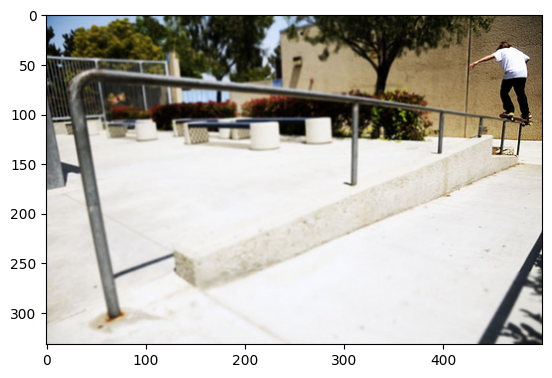

In [39]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/462288558_b31a8a976f.jpg
BLEU-4 score: 16.666666666666668
BLEU-3 score: 40.8248290463863
BLEU-2 score: 58.419068106786554
BLEU-1 score: 63.89431042462724
Real Caption: एउटा ट्यान कुकुरले अर्को ट्यान कुकुरलाई टोक्न आफ्नो मुख खोल्छ।
Predicted Caption: एउटा ट्याग कुकुरले बच्चा र एउटा कालो र सेतो कुकुरको ज्याकेटलाई टोक्छ।


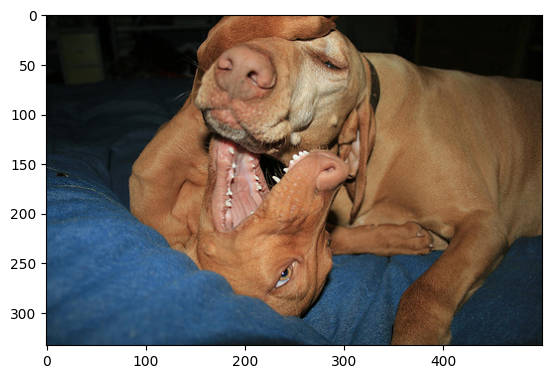

In [40]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/2314732154_83bc7f7314.jpg
BLEU-4 score: 54.290245082157575
BLEU-3 score: 33.039990982201786
BLEU-2 score: 49.43700732303953
BLEU-1 score: 54.67707026923338
Real Caption: एउटा खैरो रेशमी कुकुर घाँसमा सुतिरहेको बेला खैरो कुकुरले हेरिरहेको छ।
Predicted Caption: एउटा उभिएको खैरो कुकुरले खैरो कुकुर घाँसमा खैरो कुकुर देख्छ।


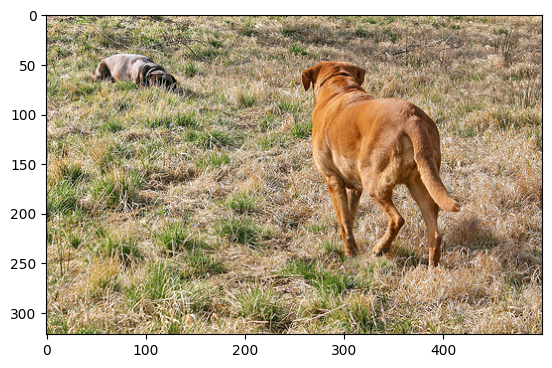

In [41]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/2602258549_7401a3cdae.jpg
BLEU-4 score: 14.285714285714285
BLEU-3 score: 37.79644730092272
BLEU-2 score: 55.778982530324605
BLEU-1 score: 61.47881529512643
Real Caption: टेबलमा हात समातिरहेको जोडी।
Predicted Caption: एउटी केटी झ्यालको छेउमा टेबलमा बसिरहेका छन्।


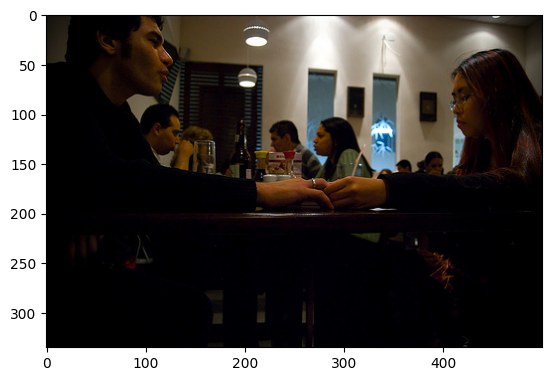

In [42]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3201427741_3033f5b625.jpg
BLEU-4 score: 0
BLEU-3 score: 0
BLEU-2 score: 0
BLEU-1 score: 0
Real Caption: स्कार्फ लगाएकी एउटी महिलाले क्यामेरालाई छेउमा हेर्छिन् र एउटा सानो बच्चालाई समात्छिन्।
Predicted Caption: सेतो कपाल भएको बच्चा वयस्कको काखमा बस्छ।


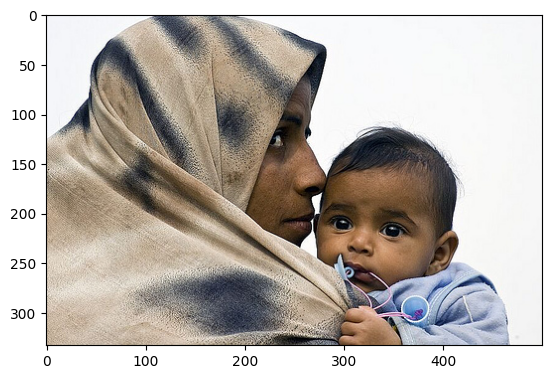

In [43]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/798343627_7492fe0c12.jpg
BLEU-4 score: 8.897082254631197
BLEU-3 score: 26.691246763893595
BLEU-2 score: 41.42069315283095
BLEU-1 score: 46.230595512422084
Real Caption: सुन्तला रंगको शर्ट र चश्मा लगाएकी केटीले ठूलो बुलबुला उडाइरहेकी छिन्।
Predicted Caption: एक गोरो केटी उफ्रन्छ र आफ्नो अनुहारमा फ्याँकिरहेको छ।


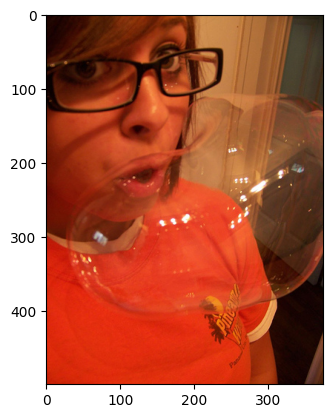

In [44]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/488196964_49159f11fd.jpg
BLEU-4 score: 0
BLEU-3 score: 0
BLEU-2 score: 0
BLEU-1 score: 0
Real Caption: एउटा कुकुरले समुद्री शैवालले ढाकिएको चट्टानमा पहेंलो डोरी बोकेको छ।
Predicted Caption: कुकुर मुखमा लट्ठी बोकेर पानीबाट निस्कन्छ।


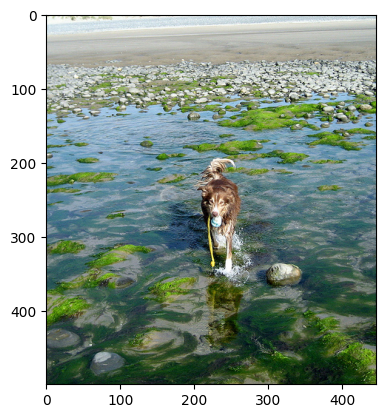

In [45]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/1100214449_d10861e633.jpg
BLEU-4 score: 33.33333333333333
BLEU-3 score: 57.735026918962575
BLEU-2 score: 71.92230933248644
BLEU-1 score: 75.98356856515926
Real Caption: एउटा सानो केटा <unk> छेउबाट खेल्दै उफ्रिरहेको छ।
Predicted Caption: एउटा केटा भवनको अगाडि बगिरहेको ढुङ्गाको पानीको फोहोराको छेउबाट हाम फालेको छ।


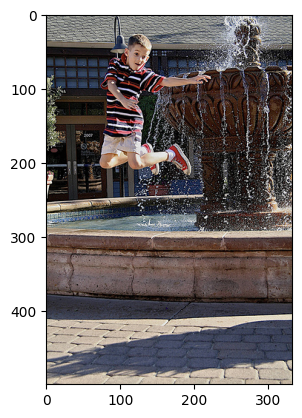

In [46]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3377570617_d2f2225a74.jpg
BLEU-4 score: 9.09090909090909
BLEU-3 score: 30.15113445777636
BLEU-2 score: 48.70596972258285
BLEU-1 score: 54.91004867761124
Real Caption: तस्विरको लागि पोज दिँदै दुई महिला
Predicted Caption: एक अर्काको छेउमा उभिएर क्यामेरा हेरेर मुस्कुराउँदै दुई अधबैंसे हेभिसेट महिला।


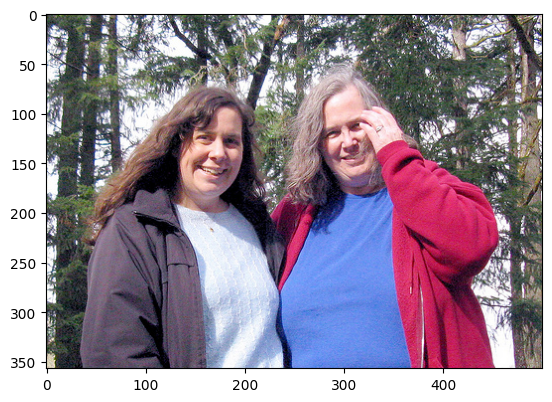

In [47]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/1501297480_8db52c15b0.jpg
BLEU-4 score: 0
BLEU-3 score: 0
BLEU-2 score: 0
BLEU-1 score: 0
Real Caption: एउटा केटाले झ्यालमा स्क्रिन राख्ने प्रयास गर्छ।
Predicted Caption: रातो प्यान्ट लगाएको कालो कपाल भएको केटा फ्रेम बाहिर कसैलाई हेर्दै।


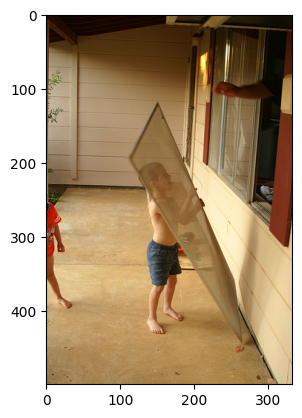

In [48]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/375392855_54d46ed5c8.jpg
BLEU-4 score: 33.33333333333333
BLEU-3 score: 20.412414523193153
BLEU-2 score: 38.54221125344267
BLEU-1 score: 45.180100180492246
Real Caption: पहेंलो ज्याकेट लगाएकी महिला हिउँ स्केट्समा सवार छिन्।
Predicted Caption: पहेंलो ज्याकेट र चश्मा लगाएर हिउँ स्कीइङ गर्दै महिला।


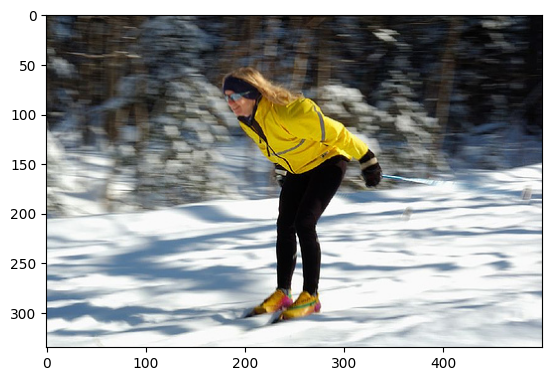

In [49]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3437315443_ba2263f92e.jpg
BLEU-4 score: 8.556951983876534
BLEU-3 score: 20.960166113993736
BLEU-2 score: 29.99334964395513
BLEU-1 score: 32.80443278078623
Real Caption: रातो शर्ट लगाएकी एउटी सानी केटी सडकको छेउमा पोलमा समातिन्।
Predicted Caption: रातो ज्याकेट लगाएको एउटा सानो बच्चा


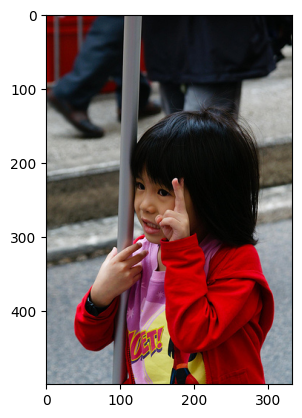

In [50]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3745451546_fc8ec70cbd.jpg
BLEU-4 score: 0
BLEU-3 score: 0
BLEU-2 score: 0
BLEU-1 score: 0
Real Caption: एक पदयात्री हिउँले भरिएको पहाडमा उक्लन्छ।
Predicted Caption: त्यो व्यक्ति स्केटबोर्डर पहाडबाट तल उड्छ।


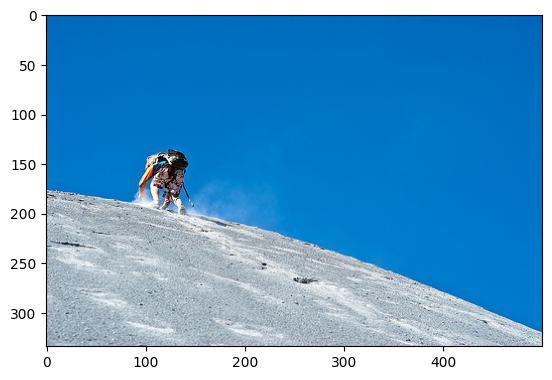

In [51]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3133825703_359a0c414d.jpg
BLEU-4 score: 0
BLEU-3 score: 0
BLEU-2 score: 0
BLEU-1 score: 0
Real Caption: सान्तालाई हेरिरहेको बच्चा।
Predicted Caption: एक टाउको मान्छे रातो र धारीदार शर्ट लगाएर हाँस्छ।


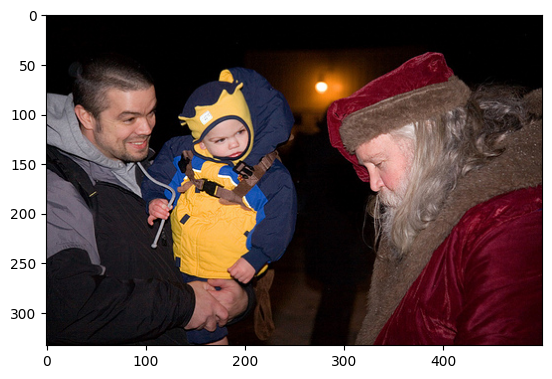

In [52]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/1056249424_ef2a2e041c.jpg
BLEU-4 score: 9.022352215774179
BLEU-3 score: 11.050079604157967
BLEU-2 score: 11.983499400196754
BLEU-1 score: 12.228923309170908
Real Caption: दुई बच्चाहरू दौडिरहेका छन् र केही पानीमा खेलिरहेका छन्।
Predicted Caption: बच्चाहरू पानीमा खेल्छन्।


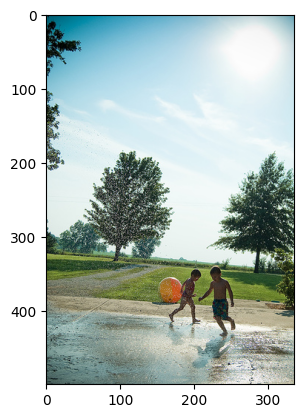

In [53]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/1056249424_ef2a2e041c.jpg
BLEU-4 score: 9.022352215774179
BLEU-3 score: 11.050079604157967
BLEU-2 score: 11.983499400196754
BLEU-1 score: 12.228923309170908
Real Caption: दुई बच्चाहरू दौडिरहेका छन् र केही पानीमा खेलिरहेका छन्।
Predicted Caption: बच्चाहरू पानीमा खेल्छन्।


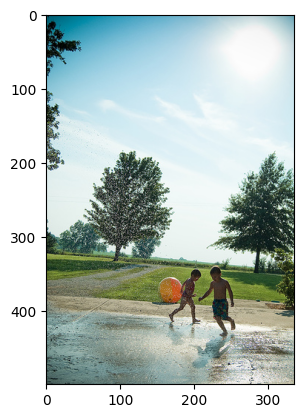

In [54]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/2192475933_d779bf42eb.jpg
BLEU-4 score: 54.88116360940264
BLEU-3 score: 47.528481874992764
BLEU-2 score: 44.577356656555914
BLEU-1 score: 38.806842947616985
Real Caption: एक केटा भिडभाडको समुद्र तटमा वेटसूट लगाएको छ।
Predicted Caption: समुद्र तटमा वेटसूट लगाएको केटा


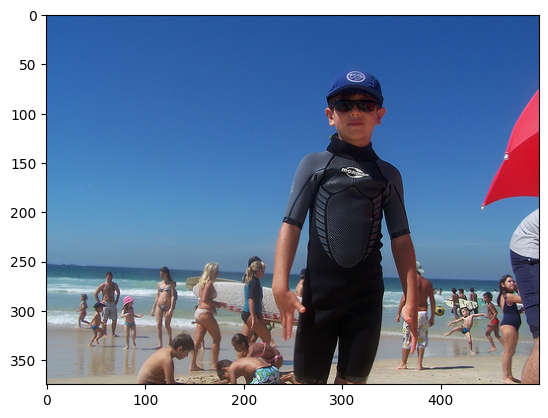

In [55]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/2710698257_2e4ca8dd44.jpg
BLEU-4 score: 11.111111111111109
BLEU-3 score: 33.33333333333333
BLEU-2 score: 51.72818579717866
BLEU-1 score: 57.735026918962575
Real Caption: एक मानिस पानीको चट्टानमा उभिएको छ।
Predicted Caption: एउटा मानिस चट्टानको टुप्पोमा उभिरहेको छ र समुद्रलाई हेर्छ।


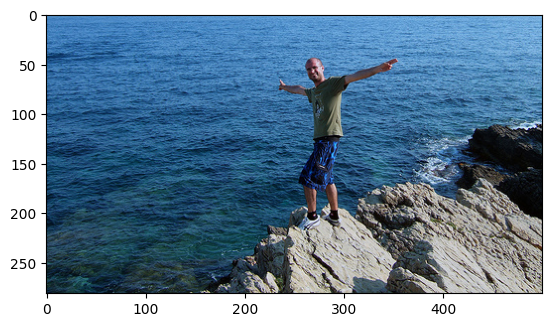

In [56]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/2292406847_f366350600.jpg
BLEU-4 score: 14.285714285714285
BLEU-3 score: 37.79644730092272
BLEU-2 score: 55.778982530324605
BLEU-1 score: 61.47881529512643
Real Caption: मानिस डुङ्गा चलाउँदै।
Predicted Caption: एकजना मानिसले पानीमा रंगको डुङ्गा चलाइरहेका छन्।


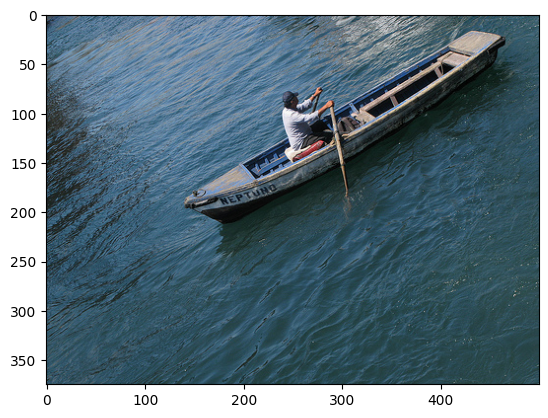

In [57]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3182570190_48214e54c7.jpg
BLEU-4 score: 5.000000000000001
BLEU-3 score: 22.360679774997898
BLEU-2 score: 40.70905315369044
BLEU-1 score: 47.28708045015879
Real Caption: कोही मानिस ठूलो बिलबोर्डको छेउबाट हिंड्छन्।
Predicted Caption: एकजना मानिस बसिरहेका छन् जबकि हावामा ट्रंक लगाएको एक जना मानिसले नजिकै सूट लगाएको छ र नीलो रङ लगाएको हुन्छ।


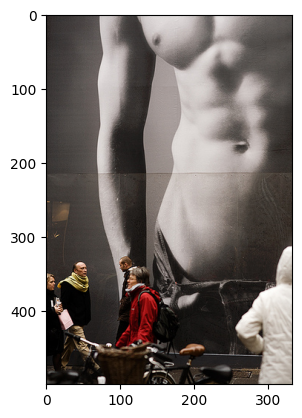

In [58]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3608663656_9192a21eeb.jpg
BLEU-4 score: 5.578254003710746
BLEU-3 score: 11.156508007421492
BLEU-2 score: 14.721100572393798
BLEU-1 score: 15.777684932819508
Real Caption: एउटा मानिस पानीलाई हेरेर ठाडो र ढुङ्गाको चट्टान चढ्दै छ।
Predicted Caption: एक मानिस रक क्लाइम्बिंग।


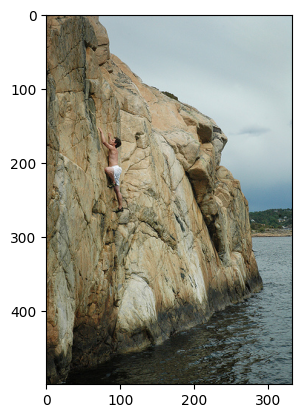

In [59]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/2945036454_280fa5b29f.jpg
BLEU-4 score: 33.33333333333333
BLEU-3 score: 20.412414523193153
BLEU-2 score: 38.54221125344267
BLEU-1 score: 45.180100180492246
Real Caption: पहेंलो कुकुरले रातो फ्रिसबी समात्न खोजिरहेको छ।
Predicted Caption: एउटा खैरो कुकुर सुन्तलाको फ्रिसबी समात्न हावामा उफ्रिरहेको छ।


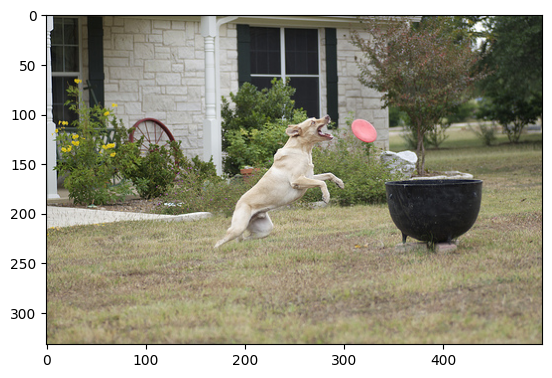

In [60]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

/kaggle/working/images/3280644151_3d89cb1e0e.jpg
BLEU-4 score: 10.000000000000002
BLEU-3 score: 31.6227766016838
BLEU-2 score: 50.11872336272724
BLEU-1 score: 56.23413251903491
Real Caption: स्केटबोर्ड र्‍याम्प र फ्रेन्च चिन्हको तस्वीर।
Predicted Caption: एउटा हलवेमा port du casque obligatoire र केही भित्तिचित्रहरू छन्।


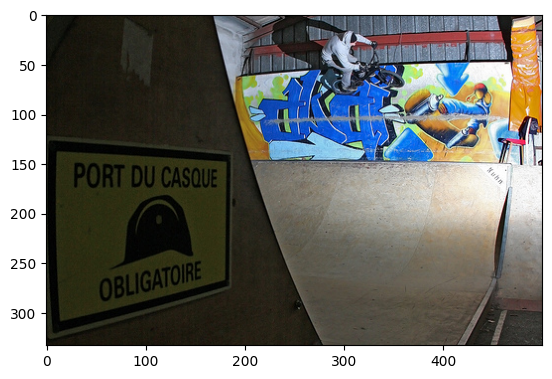

In [61]:
rid = np.random.randint(0, len(img_name_val))
image = img_name_val[rid]
print(image)
real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[rid] if i not in [0]])
caption,result,attention_plot = evaluate(image)

first = real_caption.split(' ', 1)[1]
real_caption = first.rsplit(' ', 1)[0]

for i in caption:
    if i=="<unk>":
        caption.remove(i)

for i in real_caption:
    if i=="<unk>":
        real_caption.remove(i)

result_join = ' '.join(caption)
result_final = result_join.rsplit(' ', 1)[0]
real_appn = []
real_appn.append(real_caption.split())
reference = real_appn
candidate = caption

score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
print(f"BLEU-4 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
print(f"BLEU-3 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
print(f"BLEU-2 score: {score*100}")
score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
print(f"BLEU-1 score: {score*100}")
print ('Real Caption:', real_caption)
print ('Predicted Caption:', ' '.join(caption))
temp_image = np.array(Image.open(image))
plt.imshow(temp_image)

In [62]:
data_ref=[]
data_gen=[]
cnt=0
for j in range(len(img_name_val)):
    image = img_name_val[j]
    real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[j] if i not in [0]])
    caption,result,attention_plot = evaluate(image)
    first = real_caption.split(' ', 1)[1]
    real_caption = first.rsplit(' ', 1)[0]

    for i in caption:
        if i=="<unk>":
            caption.remove(i)

    for i in real_caption:
        if i=="<unk>":
            real_caption.remove(i)

    result_join = ' '.join(caption)
    result_final = result_join.rsplit(' ', 1)[0]
    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = caption 
    # Convert the list to a string
    reference = ' '.join([' '.join(lst) for lst in reference])
    # Convert the list of words to a space-separated string
    candidate = ' '.join(candidate)
    if(len(candidate.split())>25 or len(reference.split())>25):
        continue
    data_ref.append(reference)
    data_gen.append(candidate)
    cnt +=1

print("cnt=",cnt)
    
# Specify the file name
file_name1 = "convnexttiny_reference.txt"  

# Create and write data from the list to the text file in the working directory
with open(file_name1, "w") as file:
    for item in data_ref:
        file.write(item + "\n")

print(f"Data from the list written to {file_name1} successfully.")

# Specify the file name
file_name2 = "convnexttiny_candidate.txt"  

# Create and write data from the list to the text file in the working directory
with open(file_name2, "w") as file:
    for item in data_gen:
        file.write(item + "\n")

print(f"Data from the list written to {file_name2} successfully.")

cnt= 769
Data from the list written to convnexttiny_reference.txt successfully.
Data from the list written to convnexttiny_candidate.txt successfully.


In [63]:
#Bleu score 
bleu_1=[]
bleu_2=[]
bleu_3=[]
bleu_4=[]
cnt=0
for j in range(len(img_name_val)):
    image = img_name_val[j]
    real_caption = ' '.join([tokenizer.index_word[i] for i in cap_val[j] if i not in [0]])
    caption,result,attention_plot = evaluate(image)
    first = real_caption.split(' ', 1)[1]
    real_caption = first.rsplit(' ', 1)[0]

    for i in caption:
        if i=="<unk>":
            caption.remove(i)

    for i in real_caption:
        if i=="<unk>":
            real_caption.remove(i)

    result_join = ' '.join(caption)
    result_final = result_join.rsplit(' ', 1)[0]
    real_appn = []
    real_appn.append(real_caption.split())
    reference = real_appn
    candidate = caption

    score = sentence_bleu(reference, candidate, weights=(1.0,0,0,0))
    BLEU_1 =score*100
    score = sentence_bleu(reference, candidate, weights=(0.5,0.5,0,0))
    BLEU_2 =score*100
    score = sentence_bleu(reference, candidate, weights=(0.3,0.3,0.3,0))
    BLEU_3 =score*100
    score = sentence_bleu(reference, candidate, weights=(0.25,0.25,0.25,0.25))
    BLEU_4 =score*100
    if BLEU_4>=50:
        bleu_1.append(BLEU_1)
        bleu_2.append(BLEU_2)
        bleu_3.append(BLEU_3)
        bleu_4.append(BLEU_4)
        cnt +=1
        
sum_bleu1 =sum(bleu_1)
sum_bleu2 =sum(bleu_2)
sum_bleu3 =sum(bleu_3)
sum_bleu4 =sum(bleu_4)
print("Total caption is : ",cnt)
print(f"Avarage BLEU-1 score: {sum_bleu4/cnt}")
print(f"Avarage BLEU-2 score: {sum_bleu3/cnt}")
print(f"Avarage BLEU-3 score: {sum_bleu2/cnt}")
print(f"Avarage BLEU-4 score: {sum_bleu1/cnt}")

Total caption is :  270
Avarage BLEU-1 score: 61.64351145487107
Avarage BLEU-2 score: 56.4637580442944
Avarage BLEU-3 score: 40.50620486140906
Avarage BLEU-4 score: 21.8546783629864
